In [1]:
import stlearn as st
import os
import pandas as pd
from pathlib import Path
import scanpy as sc
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image 
from typing import Optional, Union
from anndata import AnnData

/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [43]:
def draw_pie(dist,
             xpos,
             ypos,
             size,
             cmap,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum / cumsum[-1]
    pie = [0] + cumsum.tolist()

    for i, (r1, r2) in enumerate(zip(pie[:-1], pie[1:])):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])

        ax.scatter([xpos], [ypos], marker=xy, s=size, c=[cmap(int(i + 1) / 19)])

    return ax


def label_plot(
        adata: AnnData,
        name: str = None,
        method: str = None,
        tissue_alpha: float = 1.0,
        cmap: str = "vega_20_scanpy",
        show_legend: bool = True,
        show_axis: bool = False,
        dpi: int = 300,
        output: str = None,
        ues_data: str = "label",
        copy: bool = False,
        x_min: Union[float, int] = None, x_max: Union[float, int] = None, add_x: Union[float, int] = None,
        y_min: Union[float, int] = None, y_max: Union[float, int] = None, add_y: Union[float, int] = None,
) -> Optional[AnnData]:
    from stlearn.external.scanpy.plotting import palettes
    if cmap == "vega_10_scanpy":
        cmap = palettes.vega_10_scanpy
    elif cmap == "vega_20_scanpy":
        cmap = palettes.vega_20_scanpy
    elif cmap == "default_102":
        cmap = palettes.default_102
    elif cmap == "default_28":
        cmap = palettes.default_28
    else:
        raise ValueError(
            "We only support vega_10_scanpy, vega_20_scanpy, default_28, default_102")

    cmaps = matplotlib.colors.LinearSegmentedColormap.from_list("", cmap)

    cmap_ = plt.cm.get_cmap(cmaps)

    labels_df = adata.obsm[ues_data]

    plt.rcParams['figure.dpi'] = dpi

    # Option for turning off showing figure
    plt.ioff()

    # Initialize matplotlib
    fig, a = plt.subplots()

    for index, row in labels_df.iterrows():
        draw_pie(row, adata.obs["imagecol"][index], adata.obs["imagerow"][index], 6, cmap_, ax=a)

    plt.xlim([x_min - add_x, x_max + add_x])
    plt.ylim([y_max + add_y, y_min - add_y])

    if show_legend:
        from matplotlib.patches import Patch
        legend_elements = [Patch(color=cmap_(int(i + 1) / 19), label=j) for i, j in enumerate(labels_df.columns.values)]
        a.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.5), prop=dict(size=7))

    if not show_axis:
        a.axis('off')

    # Overlay the tissue image
    a.imshow(adata.uns["tissue_img"], alpha=tissue_alpha, zorder=-1, )

    if name is None:
        name = method
    if output is not None:
        fig.savefig(output + "/" + name + ".pdf", dpi=dpi, bbox_inches='tight', pad_inches=0)

    plt.show()

In [3]:

def global_label_plot(adata, ues_data="label",
                     output=None, name=None, dpi=500):
    x_min, x_max = adata.obs["imagecol"].min(), adata.obs["imagecol"].max()
    y_min, y_max = adata.obs["imagerow"].min(), adata.obs["imagerow"].max()
    add_x = (x_max - x_min)//20
    add_y = (y_max - y_min)//20

    label_plot(adata, ues_data=ues_data, output=output, name=name, 
               x_min=x_min, x_max=x_max, add_x=add_x, 
               y_min=y_min, y_max=y_max, add_y=add_y, dpi=dpi)

In [4]:
# data = st.read.file_10x_h5("filtered_feature_bc_matrix.h5")
# data.var_names_make_unique()
path = '/QRISdata/Q1851/Minh/Spatial_transcriptomic/C1_refined/'
data = st.read.file_10x_mtx(os.path.join(path, "filtered_feature_bc_matrix"))
data.var_names_make_unique()

In [5]:
st.add.image(adata=data, imgpath=path + "spatial/tissue_hires_image.png")

Trying to set attribute `.uns` of view, copying.


Added tissue image to the object!


In [6]:
st.add.positions(data,position_filepath =path +  "spatial/tissue_positions_list.csv",
                scale_filepath = path + "spatial/scalefactors_json.json",
                quality="high")

In [7]:
tissues = pd.read_csv('/QRISdata/Q1851/Minh/RNAScope/SkinSpatial/Tissue2_only.csv', sep=',', index_col = 0)
data.obs['tissue'] = tissues.Tissue2 # if your object is called "data"
data_subset = data[data.obs['tissue'] == 'Tissue2']

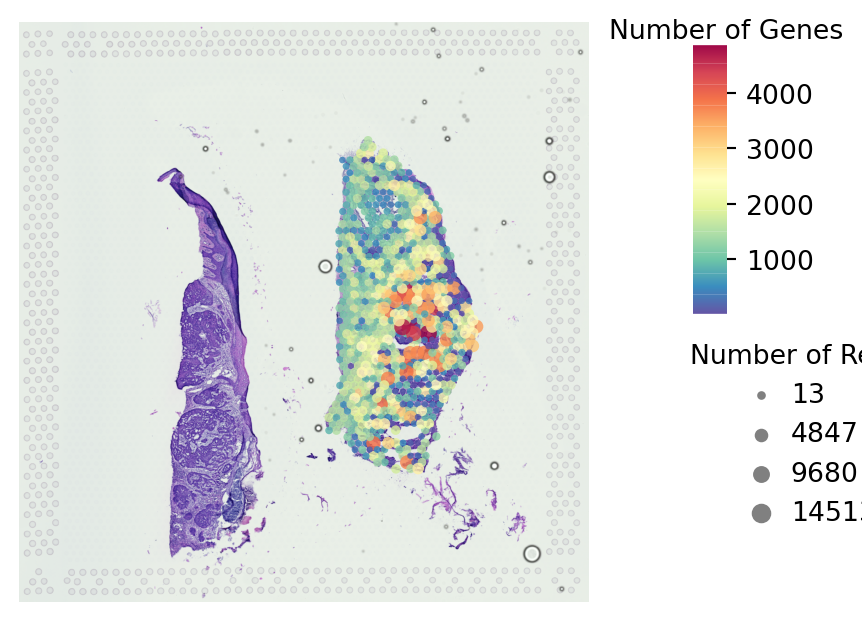

In [8]:
st.pl.QC_plot(data_subset)

In [ ]:
st.pl.QC_plot(data_subset, )

In [56]:
??st.pl.QC_plot

In [9]:
data

AnnData object with n_obs × n_vars = 1179 × 33538 
    obs: 'imagerow', 'imagecol', 'tissue'
    var: 'gene_ids', 'feature_types'
    uns: 'tissue_img'

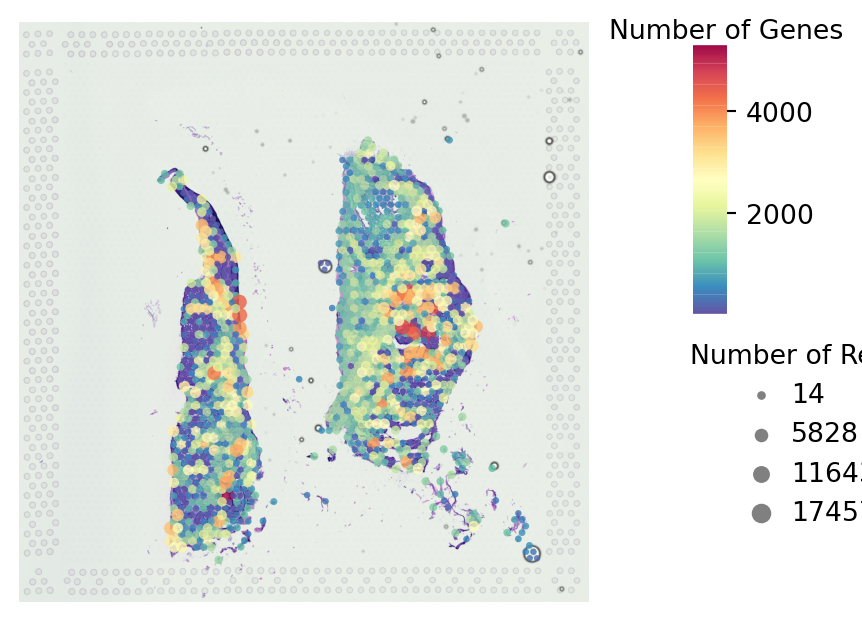

In [10]:
#perform this before normalisation 
st.pl.QC_plot(data)

In [11]:
st.pp.filter_genes(data_subset,min_cells=3)

filtered out 18943 genes that are detected in less than 3 cells


Trying to set attribute `.var` of view, copying.


In [12]:
ST_LABEL = 'predict_assay_subset_rmfibroblast_2.csv'

label_df = pd.read_csv(ST_LABEL, index_col=0)
# label_df_ = label_df.T[data.obs_names]
label_df.head(15)

,AAACAAGTATCTCCCA-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCGTTCGTCCAGG-1,AAACGAGACGGTTGAT-1,AAAGTGTGATTTATCT-1,AAAGTTGACTCCCGTA-1,AAATAGCTTAGACTTT-1,AAATAGGGTGCTATTG-1,AAATCTAGCCCTGCTA-1,...,TTGGCTCGCATGAGAC-1,TTGGGCGGCGGTTGCC-1,TTGGTCACACTCGTAA-1,TTGTAAGGACCTAAGT-1,TTGTAAGGCCAGTTGG-1,TTGTGGTGGTACTAAG-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTGTATTACACG-1
T cells,0.035814,0.024683,0.085743,0.145462,0.909341,0.033954,0.653707,0.197027,0.125689,0.030901,...,0.026987,0.056063,0.000000,0.204508,0.159526,0.197034,0.180417,0.032011,0.146104,0.025344
macrophages/dendritic,0.257627,0.243260,0.259431,0.090012,0.027789,0.413388,0.113038,0.020129,0.070369,0.229749,...,0.515003,0.175569,0.000000,0.197156,0.071511,0.145705,0.250402,0.310511,0.136399,0.084202
pericytes,0.342138,0.316136,0.099209,0.072327,0.016156,0.057825,0.055600,0.000603,0.453649,0.149359,...,0.196906,0.436608,0.000000,0.002315,0.126636,0.079751,0.062150,0.035798,0.076982,0.250414
epidermal stem cell,0.069735,0.051200,0.258701,0.236790,0.034395,0.070385,0.013064,0.094709,0.202278,0.206160,...,0.000000,0.090525,0.021876,0.176349,0.141562,0.226961,0.426859,0.107582,0.437857,0.045128
vascular endothelial,0.000000,0.231881,0.016428,0.154429,0.000294,0.336872,0.058039,0.056352,0.015744,0.027757,...,0.044652,0.008058,0.002455,0.031026,0.036722,0.083351,0.012532,0.371170,0.088826,0.119875
differentiated keratinocytes,0.267674,0.127774,0.275348,0.266511,0.011885,0.006954,0.023689,0.147088,0.104023,0.294286,...,0.122495,0.103054,0.975668,0.081158,0.202006,0.178840,0.067640,0.129666,0.113833,0.136362
lymphatic endothelial cells,0.027012,0.000000,0.005141,0.034469,0.000140,0.035127,0.073247,0.000000,0.000000,0.002649,...,0.090621,0.130124,0.000000,0.003994,0.002918,0.000000,0.000000,0.010583,0.000000,0.338676
melanocytes,0.000000,0.005065,0.000000,0.000000,0.000000,0.042808,0.009616,0.000000,0.000000,0.059138,...,0.002998,0.000000,0.000000,0.000000,0.000000,0.016940,0.000000,0.000000,0.000000,0.000000
erythrocytes,0.000000,0.000000,0.000000,0.000000,0.000000,0.002686,0.000000,0.484092,0.028248,0.000000,...,0.000338,0.000000,0.000000,0.303493,0.259118,0.071418,0.000000,0.002679,0.000000,0.000000
max,0.342138,0.316136,0.275348,0.266511,0.909341,0.413388,0.653707,0.484092,0.453649,0.294286,...,0.515003,0.436608,0.975668,0.303493,0.259118,0.226961,0.426859,0.371170,0.437857,0.338676


In [13]:
label_df_Transfer = label_df[data_subset.obs_names]

In [14]:
label_df_Transfer.transpose().iloc[:, 0:-1]

,T cells,macrophages/dendritic,pericytes,epidermal stem cell,vascular endothelial,differentiated keratinocytes,lymphatic endothelial cells,melanocytes,erythrocytes
AAACAAGTATCTCCCA-1,0.035814,0.257627,0.342138,0.069735,0.000000,0.267674,0.027012,0.000000,0.000000
AAACATTTCCCGGATT-1,0.085743,0.259431,0.099209,0.258701,0.016428,0.275348,0.005141,0.000000,0.000000
AAACGAGACGGTTGAT-1,0.909341,0.027789,0.016156,0.034395,0.000294,0.011885,0.000140,0.000000,0.000000
AAAGTGTGATTTATCT-1,0.033954,0.413388,0.057825,0.070385,0.336872,0.006954,0.035127,0.042808,0.002686
AAAGTTGACTCCCGTA-1,0.653707,0.113038,0.055600,0.013064,0.058039,0.023689,0.073247,0.009616,0.000000
...,...,...,...,...,...,...,...,...,...
TTGGCCTAGAATTTCG-1,0.111706,0.501708,0.027047,0.303850,0.000343,0.036646,0.000000,0.000000,0.018701
TTGGGCGGCGGTTGCC-1,0.056063,0.175569,0.436608,0.090525,0.008058,0.103054,0.130124,0.000000,0.000000
TTGTAAGGCCAGTTGG-1,0.159526,0.071511,0.126636,0.141562,0.036722,0.202006,0.002918,0.000000,0.259118
TTGTGGTGGTACTAAG-1,0.197034,0.145705,0.079751,0.226961,0.083351,0.178840,0.000000,0.016940,0.071418


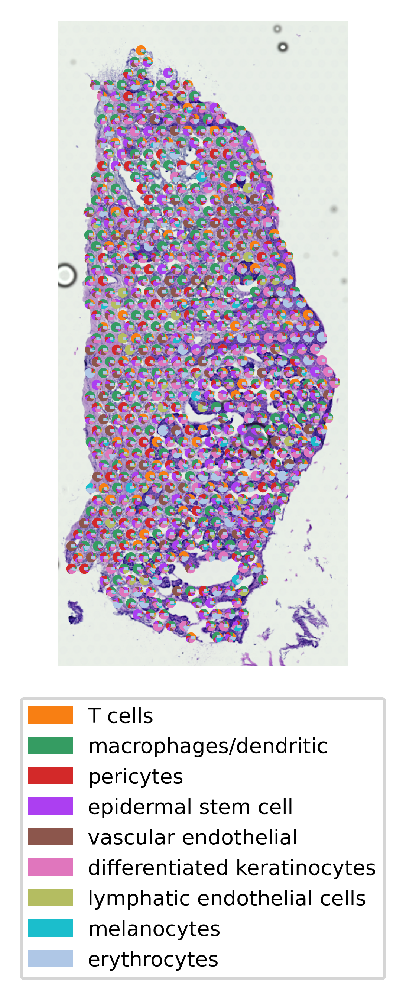

In [48]:
data_subset.obsm["label"] = label_df_Transfer.transpose().iloc[:, 0:-1]
global_label_plot(data_subset, output='/QRISdata/Q1851/Minh/RNAScope/SkinSpatial',name='scater_plot_subset2', dpi=575)

In [19]:
def coloc_lot_filter(adata, cell_tpyes, threshold_filter_low=0.0, 
                     threshold_filter_high=1.0, threshold_select=0.0,
                     output=None, name=None):
    x_min, x_max = adata.obs["imagecol"].min(), adata.obs["imagecol"].max()
    y_min, y_max = adata.obs["imagerow"].min(), adata.obs["imagerow"].max()
    add_x = (x_max - x_min)//20
    add_y = (y_max - y_min)//20
    df = adata.obsm["label"]
    df_coloc = df.loc[:, cell_tpyes]
    for i in cell_tpyes:
        df_coloc = df_coloc.query('`{0}` > @threshold_filter_low & `{0}` < @threshold_filter_high'.format(i))
    
    df_coloc = df_coloc[df_coloc.sum(axis=1) > threshold_select]
    df_coloc = df_coloc.div(df_coloc.sum(axis=1), axis=0)
    data_coloc = adata[df_coloc.index,:]
    data_coloc.obsm["coloc"] = df_coloc
    label_plot(data_coloc, ues_data="coloc", output=output, name=name, 
               x_min=x_min, x_max=x_max, add_x=add_x, 
               y_min=y_min, y_max=y_max, add_y=add_y)

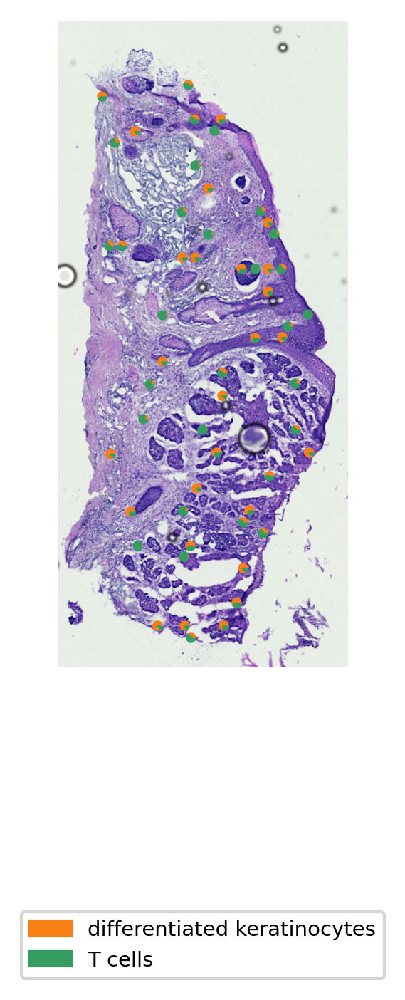

In [45]:
coloc_lot_filter(data_subset, ["differentiated keratinocytes", "T cells"], 
                 threshold_filter_low=0.05, threshold_filter_high=0.9, threshold_select=0.5,output='/QRISdata/Q1851/Minh/RNAScope/SkinSpatial',name='scater_plot_keratinocytes_vs_Tcells')

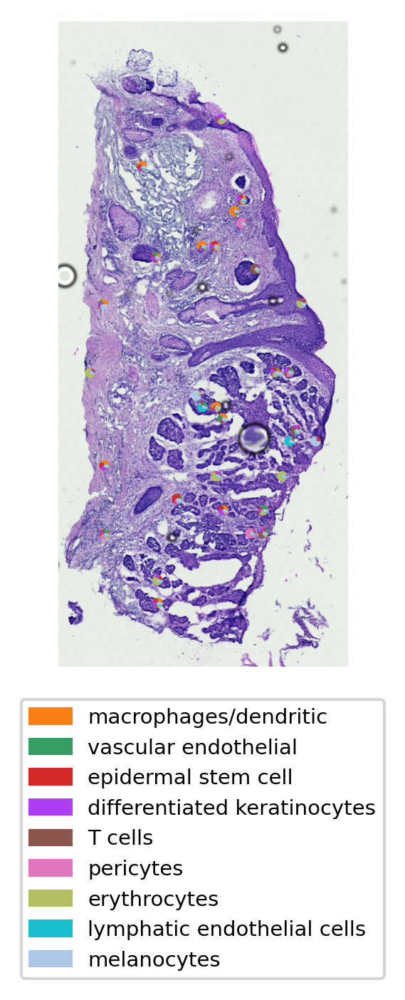

In [47]:
coloc_lot_filter(data_subset, ['macrophages/dendritic',
                                            'vascular endothelial', 'epidermal stem cell',
                                            'differentiated keratinocytes', 'T cells', 'pericytes',
                                            'erythrocytes', 'lymphatic endothelial cells', 'melanocytes'], 
                 threshold_filter_low=0.0, threshold_filter_high=1, threshold_select=0,output='/QRISdata/Q1851/Minh/RNAScope/SkinSpatial',name='scater_plot_subset2')

In [17]:
def coloc_plot(
        adata: AnnData,
        name: str = None,
        title: str = None,
        method: str = None,
        cmap: str = "Spectral_r",
        tissue_alpha: float = 0.75,
        spot_size: Union[float, int] = 40,
        show_color_bar: bool = True,
        show_axis: bool = False,
        dpi: int = 300,
        output: str = None,
        x_min: Union[float, int] = None, x_max: Union[float, int] = None, add_x: Union[float, int] = None,
        y_min: Union[float, int] = None, y_max: Union[float, int] = None, add_y: Union[float, int] = None,
) -> Optional[AnnData]:
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0.5, 1))
    alpha_scale = scaler.fit_transform(data.obs["coloc"].to_numpy().reshape(-1, 1))

    plt.rcParams['figure.dpi'] = dpi

    # Option for turning off showing figure
    plt.ioff()

    # Initialize matplotlib
    fig, a = plt.subplots()

    vmin = 0.0
    vmax = 1.0
    # Plot scatter plot based on pixel of spots
    for i, (index, row) in enumerate(data.obs.iterrows()):
        plot = a.scatter(row["imagecol"], row["imagerow"], edgecolor="none", alpha=alpha_scale[i][0], marker="o",
                         vmin=vmin, vmax=vmax, cmap=plt.get_cmap(cmap), c=row["coloc"], s=spot_size)

    plt.xlim([x_min - add_x, x_max + add_x])
    plt.ylim([y_max + add_y, y_min - add_y])

    if show_color_bar:
        print('Color bar', show_color_bar)
        cb = plt.colorbar(plot, cax=fig.add_axes([0.85, 0.5, 0.05, 0.35]), cmap=cmap)
        cb.ax.set_xlabel(title, fontsize=8)
        cb.ax.xaxis.set_label_coords(0.98, 1.10)
        cb.outline.set_visible(False)

    if not show_axis:
        a.axis('off')

    # Overlay the tissue image
    a.imshow(adata.uns["tissue_img"], alpha=tissue_alpha, zorder=-1, )

    # fig.tight_layout()
    if name is None:
        name = method
    if output is not None:
        fig.savefig(output + "/" + name + ".pdf", dpi=dpi, bbox_inches='tight', pad_inches=0)
    
    plt.show()
#     plt.colorbar(orientation='horizontal')

def coloc_lot_heatmap(adata, cell_tpyes, threshold_filter_low=0.1, spot_size = 30, 
                     threshold_filter_high=0.8, threshold_select=0.5,
                     output=None, name=None, title = None):
    x_min, x_max = adata.obs["imagecol"].min(), adata.obs["imagecol"].max()
    y_min, y_max = adata.obs["imagerow"].min(), adata.obs["imagerow"].max()
    add_x = (x_max - x_min)//20
    add_y = (y_max - y_min)//20
    df = adata.obsm["label"]
    df_coloc = df.loc[:, cell_tpyes]
    for i in cell_tpyes:
        df_coloc = df_coloc.query('`{0}` > @threshold_filter_low & `{0}` < @threshold_filter_high'.format(i))
    
    df_coloc = df_coloc[df_coloc.sum(axis=1) > threshold_select]
    df_coloc_all = df.loc[:, cell_tpyes]
    df_coloc_all[cell_tpyes] = 0
    df_coloc_all.loc[df_coloc.index, :] = df_coloc
    data.obs["coloc"] = df_coloc_all.sum(axis=1)
    if name and output:
        name = "heatmap_"+name
    
    coloc_plot(data, spot_size=spot_size, name=name, output=output, cmap="viridis", title = title, 
               show_color_bar = True,
               x_min=x_min, x_max=x_max, add_x=add_x, 
               y_min=y_min, y_max=y_max, add_y=add_y)

Color bar True


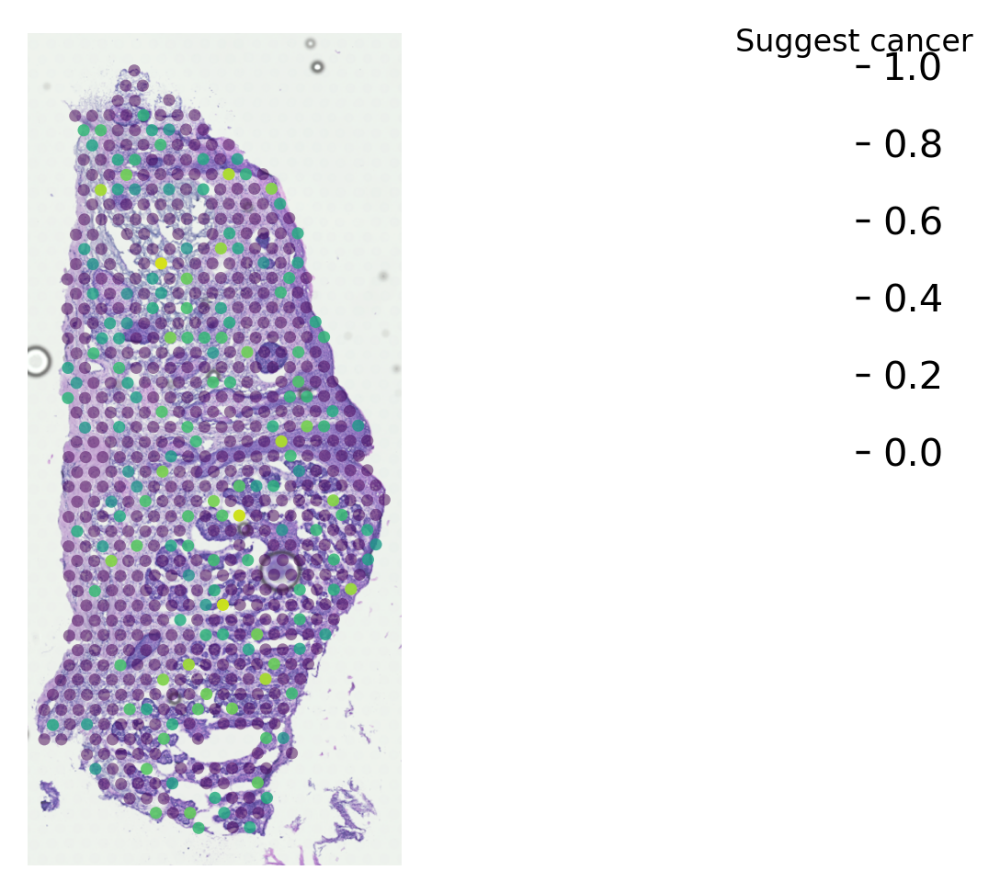

In [38]:

coloc_lot_heatmap(data_subset, ["differentiated keratinocytes", "T cells",'epidermal stem cell'], spot_size= 10,
                 threshold_filter_low=0.05, threshold_filter_high=0.9, threshold_select=0.5,
                 title = "Suggest cancer",output='/QRISdata/Q1851/Minh/RNAScope/SkinSpatial',name='scater_plot_heatmap')

In [50]:
st.em.run_pca(data_subset,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [51]:
st.pp.neighbors(data_subset,n_neighbors=15)

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


In [52]:
st.em.run_umap(data_subset)

UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']


In [53]:
st.spatial.smooth.disk(data_subset,rates=2,method="median",use_data="X_umap")

Disk smoothing function is applied! The new data are stored in adata.obsm["X_diffmap_disk"]


In [54]:
%matplotlib inline
st.tl.clustering.kmeans(data_subset,n_clusters=3,use_data="X_umap_disk")

Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


In [57]:
??st.pl.cluster_plot

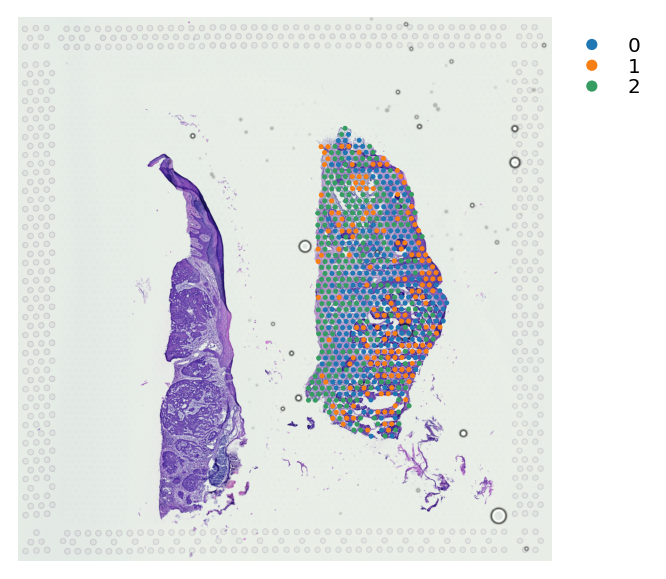

In [58]:
st.pl.cluster_plot(data_subset,use_label="kmeans",data_alpha=1, spot_size=4, name="k_mean_stLearn_2", output="./")

In [31]:
st.pp.neighbors(data_subset,n_neighbors=20,use_rep='X_umap_disk')


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


In [43]:
st.tl.clustering.louvain(data_subset, resolution=0.3)

Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


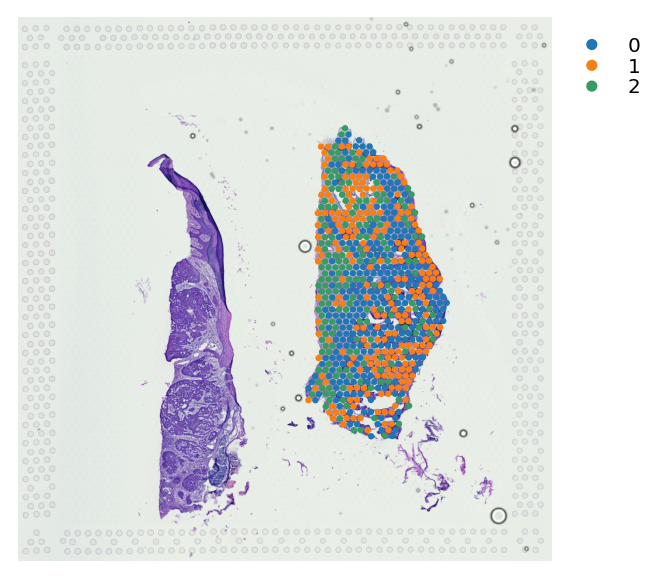

In [44]:
st.pl.cluster_plot(data_subset,use_label="louvain")

In [34]:
import os  
# do this one time only
os.mkdir("Tile_sample1")
TILE_PATH="./Tile_sample1"
# spot image preprocessing
st.pp.tiling(data_subset, out_path=TILE_PATH, crop_size=299) 

Tiling image: 100%|██████████ [ time left: 00:00 ]


In [35]:
st.pp.extract_feature(data_subset, )

Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [36]:
st.spatial.morphology.adjust(data_subset,radius=140)

Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']


# Clustering with morphology

In [39]:
# raise Exception('File .h5 get error in tissue position and scalefactors')
file_path = "/QRISdata/Q1040/IntermediateData/Quan_Visium2/Visium_LP2_map_C1/outs/"
data_2 = st.read.file_10x_h5(os.path.join(file_path,"filtered_feature_bc_matrix.h5"))
data_2.var_names_make_unique()
st.add.image(adata=data_2, imgpath= os.path.join(file_path, "spatial/tissue_hires_image.png"))
st.add.positions(data_2,position_filepath = os.path.join(file_path,"spatial/tissue_positions_list.csv"),
                scale_filepath = os.path.join(file_path,"spatial/scalefactors_json.json"),
                quality="high")
st.pp.filter_genes(data_2,min_cells=3)
st.pp.normalize_total(data_2)
st.pp.log1p(data_2)
st.pp.scale(data_2)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.


Added tissue image to the object!
filtered out 18434 genes that are detected in less than 3 cells
normalizing counts per cell
Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


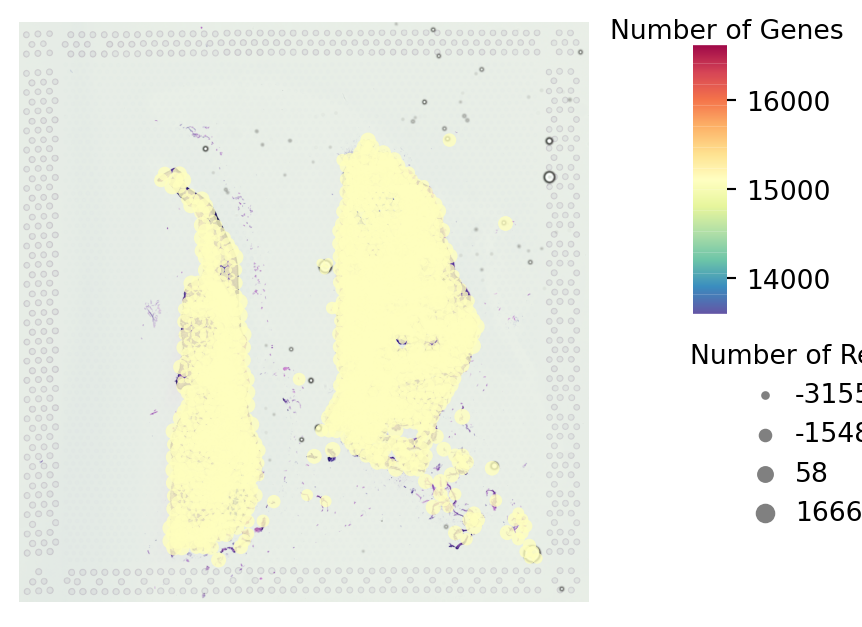

In [40]:
st.pl.QC_plot(data_2)

In [41]:
# run PCA for gene expression data
st.em.run_pca(data_2,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [42]:
import os  
# do this one time only
os.mkdir("Tile_3")
TILE_PATH="./Tile_3"
# spot image preprocessing
st.pp.tiling(data_2, out_path=TILE_PATH, crop_size=299) 

Tiling image: 100%|██████████ [ time left: 00:00 ]


In [43]:
st.pp.extract_feature(data_2, )

Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [29]:
??st.pp.extract_feature

In [44]:
# Use tissue morphology to adjust gene expression
st.spatial.morphology.adjust(data_2,radius=140)

Adjusting data:   6%|▌          [ time left: 00:24 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
Adjusting data:  50%|█████      [ time left: 00:12 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
Adjusting data:  66%|██████▋    [ time left: 00:08 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/90d

The data adjusted by morphology is added to adata.obsm['X_pca_morphology']


In [36]:
??st.spatial.morphology.adjust

In [28]:
print(data.obsm)

AxisArrays with keys: filtered_counts, X_pca, X_tile_feature, X_morphology, X_pca_morphology


In [45]:
ori_dat = data_2.obsm["X_pca_morphology"]

In [32]:
print(data)

AnnData object with n_obs × n_vars = 1179 × 15630 
    obs: 'imagerow', 'imagecol', 'sum_counts', 'kmeans', 'louvain', 'tile_path'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'tissue_img', 'log1p', 'pca', 'neighbors', 'umap', 'tmp_color', 'louvain'
    obsm: 'filtered_counts', 'X_pca', 'X_umap', 'X_umap_disk', 'X_tile_feature', 'X_morphology', 'X_pca_morphology'
    varm: 'PCs'


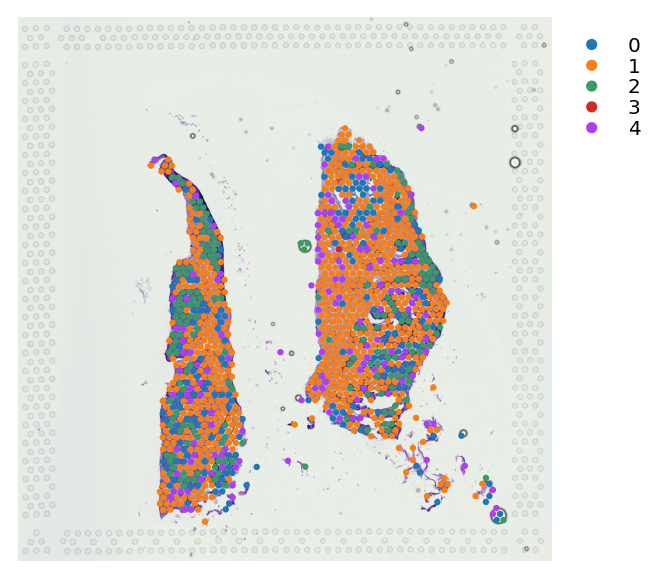

In [48]:
# kmeans clustering on umap
# st.tl.clustering.kmeans(data_2, n_clusters=5, use_data="X_pca")
st.pl.cluster_plot(data_2, use_label="kmeans")

In [49]:
# KNN
st.pp.neighbors(data_2,n_neighbors=5)
 
# UMAP
st.em.run_umap(data_2)

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']


Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


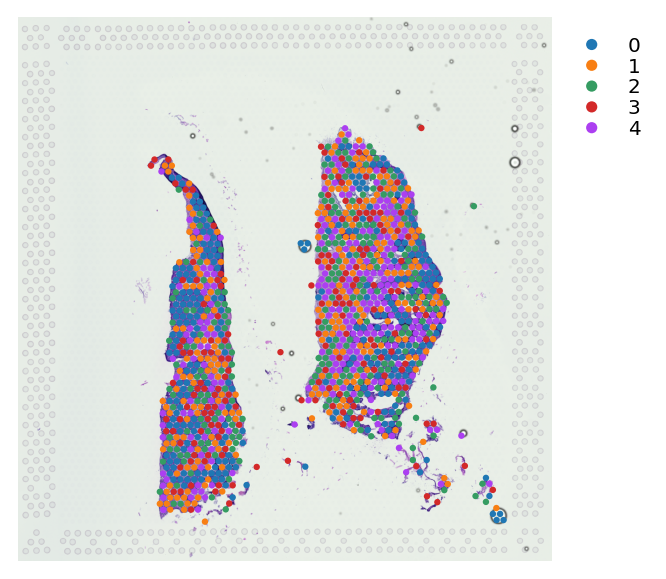

In [50]:
# kmeans clustering on umap
st.tl.clustering.kmeans(data_2,n_clusters=5,use_data="X_umap")
st.pl.cluster_plot(data_2,use_label="kmeans")

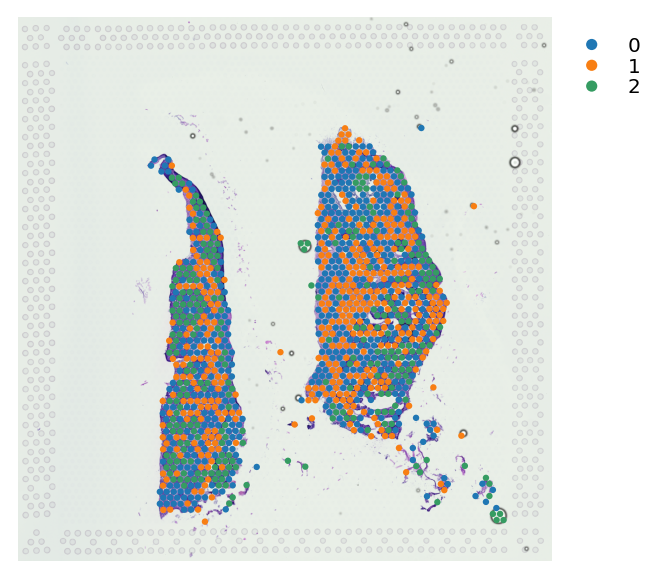

In [60]:
# KNN
# st.pp.neighbors(data_2,n_neighbors=15)
 
# Louvain clustering on umap
# st.tl.clustering.louvain(data_2, resolution=0.9)
st.pl.cluster_plot(data_2,use_label="louvain")

In [67]:
print(data_2.uns['louvain'])

{'params': {'resolution': 0.9, 'random_state': 0}}


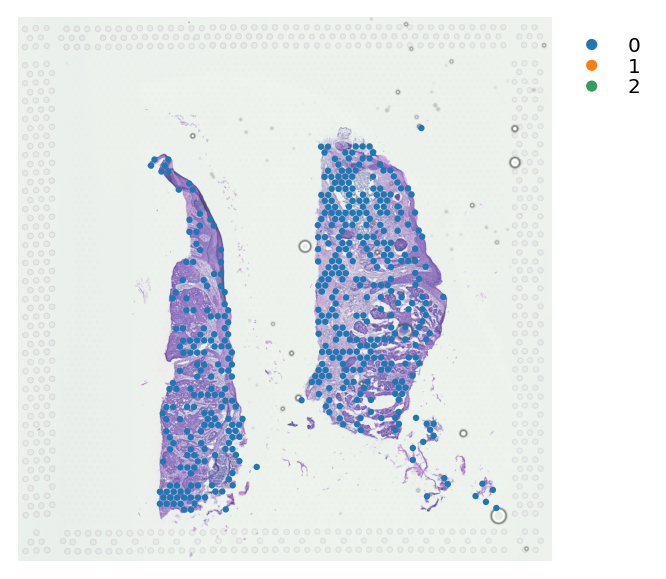

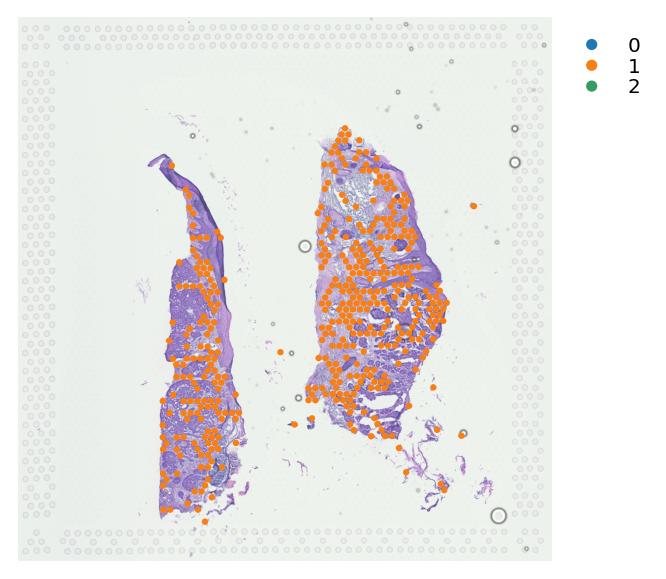

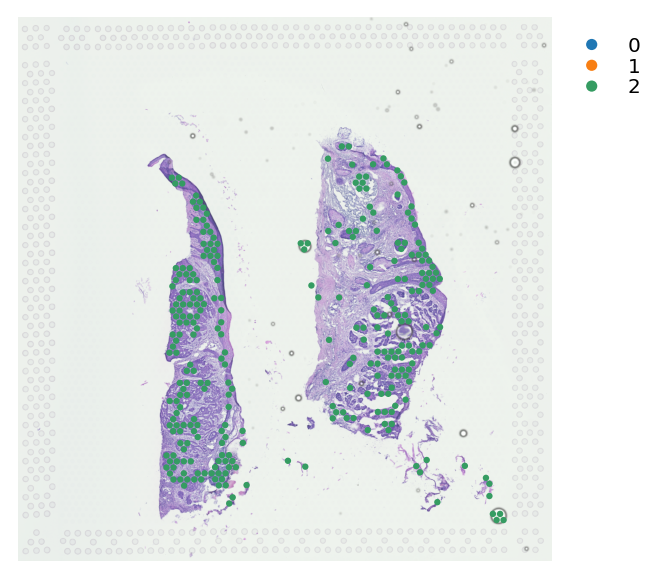

In [75]:
st.pl.cluster_plot(data_2, list_cluster=[0], use_label='louvain',tissue_alpha=0.75)
st.pl.cluster_plot(data_2, list_cluster=[1], use_label='louvain',tissue_alpha=0.75)
st.pl.cluster_plot(data_2, list_cluster=[2], use_label='louvain',tissue_alpha=0.75)

In [73]:
?st.pl.cluster_plot

# Trajectory 

In [52]:
st.spatial.smooth.disk(data_2,rates=2,method="median",use_data="X_umap")
st.pp.neighbors(data_2,n_neighbors=100,use_rep='X_umap_disk')
st.tl.clustering.louvain(data_2)

Disk smoothing function is applied! The new data are stored in adata.obsm["X_diffmap_disk"]
Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


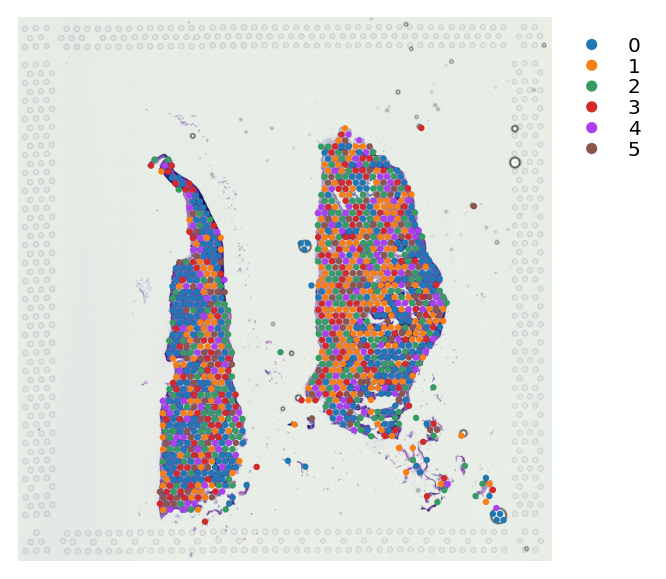

In [53]:
st.pl.cluster_plot(data_2,use_label="louvain")

In [55]:
st.spatial.trajectory.global_level(data_2)


... storing 'feature_types' as categorical
... storing 'genome' as categorical
Adjusting data:   2%|▏          [ time left: 00:03 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
Adjusting data:   5%|▍          [ time left: 00:03 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
Adjusting data:   7%|▋          [ time left: 00:03 ]/90days/s4596423/envs/stlearn/lib/python3.7/site-packages/numpy/core/from

The data adjusted by morphology is added to adata.obsm['X_diffmap_morphology']
    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X


PAGA plot:


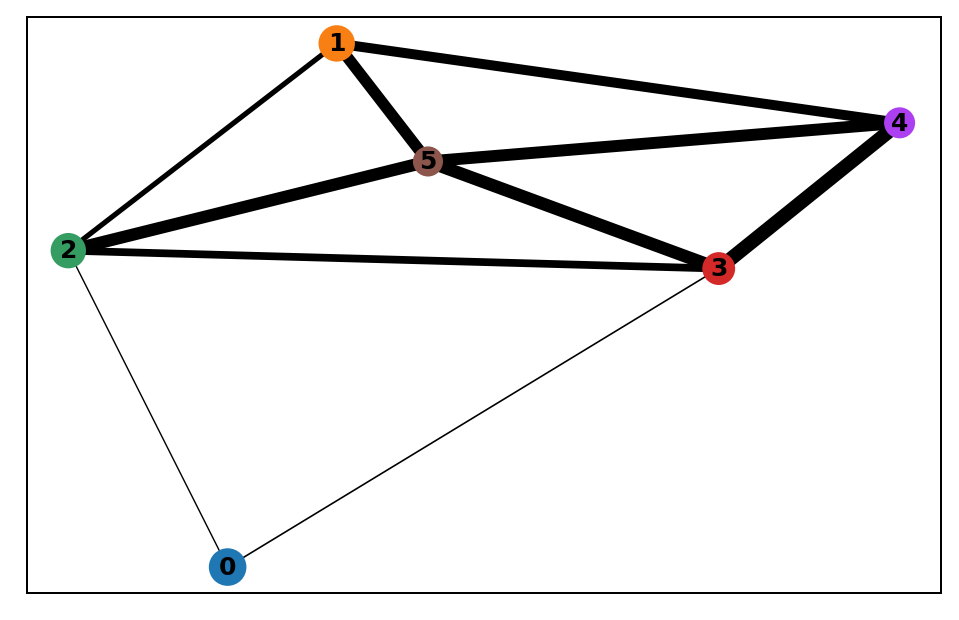

Gene expression (reduced dimension) plot:


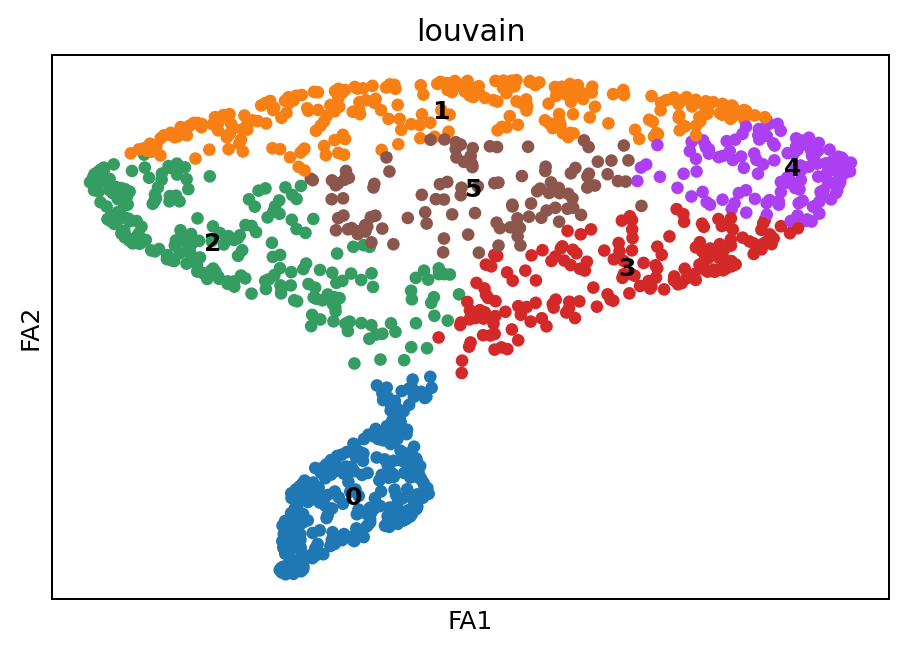

Diffusion pseudotime plot:


KeyError: 'dpt_pseudotime'

In [56]:
st.pl.non_spatial_plot(data_2)

In [57]:
print(data_2)

AnnData object with n_obs × n_vars = 1179 × 15104 
    obs: 'imagerow', 'imagecol', 'sum_counts', 'tile_path', 'kmeans', 'louvain', 'sub_cluster_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'tissue_img', 'log1p', 'pca', 'tmp_color', 'neighbors', 'umap', 'louvain', 'paga', 'louvain_sizes', 'diffmap_evals', 'split_node', 'global_graph', 'centroid_dict', 'louvain_colors', 'draw_graph'
    obsm: 'filtered_counts', 'X_pca', 'X_tile_feature', 'X_morphology', 'X_pca_morphology', 'X_umap', 'X_umap_disk', 'X_diffmap', 'X_diffmap_morphology', 'X_draw_graph_fa'
    varm: 'PCs'


In [58]:
??st.spatial.trajectory